In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [4]:
import networkit as nk
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import pairwise_distances
from IPython.display import display, Math, Latex, Markdown
from tqdm.notebook import tqdm
from numpy.linalg import norm

from External.ICT.calculate_ICT import calculate_ICT, compute_widths
from External.clustering import k_means_pp, centers
from External.generation import create_graph
from External.plotting import plot_points, plot_graph, no_intersections
from External.data_loader import data_loader
from External.ICT.reduce_to_mst import MST



plt.style.use('standard.mplstyle')

cv2 package not present. No movies possible


In [5]:
def patch_together_nearest(G, position):
    list_of_all_nodes = np.array(range(G.numberOfNodes()))
    
    cc = nk.components.ConnectedComponents(G)
    cc.run()
    components = cc.getComponents()
    number_of_components = cc.numberOfComponents()
    
    bridges = 1
    
    while number_of_components != 1:

            

        compA = np.array(components[0])
        compB = np.delete(list_of_all_nodes, compA)


        pointsA = position[compA]
        pointsB = position[compB]
        
        diff = pairwise_distances(pointsA, pointsB, n_jobs=-1)

        top_bridges = np.argpartition(diff.flatten(), bridges)[0:bridges]
        indices = np.unravel_index(top_bridges, diff.shape)
        nodesA = compA[indices[0]]
        nodesB = compB[indices[1]]

        for i in range(bridges):
            try:
                nodeA = nodesA[i]
                nodeB = nodesB[i]
            except:
                print(nodesA, nodesB, indices, top_bridges, compA, compB)
                raise RuntimeError("Bug somewhere")
            distance = norm(position[nodeA] - position[nodeB])
            if not G.hasEdge(nodeA, nodeB):
                G.addEdge(nodeA, nodeB, distance)

                    
        cc = nk.components.ConnectedComponents(G)
        cc.run()
        components = cc.getComponents()
        number_of_components = cc.numberOfComponents()
        
    return G

In [6]:
# Hyperparameters
mode = "K_Nearest+Density2"
metric = "euclidean"
dataset = "eth_CC"

threshold = 12

# for the filename
parameters = "2-0_5-12"

In [7]:
start = time.time()

# load the dataset & UMAP embedding (if dim > 2, othervise embedding=position)
position, labels, embedding = data_loader(dataset, True)

# calculate the clusters
if len(position[0]) > 500:
    pca = PCA(n_components=100).fit_transform(StandardScaler().fit_transform(position))
else:
    pca = StandardScaler().fit_transform(position)

    
# Save the number of nodes (sometimes needed)
number_of_nodes = len(position)
    
# calculate the cluster centers and the components
ε, δ = 0.03, 0.1
r = 1 / (ε**2) * (int(np.log2(number_of_nodes - 1)) + 1 + np.log(1/δ))
k = int(np.sqrt(r))
k = np.min((k, number_of_nodes))    

cluster_centers, labels = k_means_pp(k, pca, metric=metric, return_labels=True)
unique_labels = np.unique(labels)


print("Time for data preperation: ", time.time()-start)

sklearn is done: 29.959367036819458
My own part is done: 1.0193963050842285
Time for data preperation:  99.89854431152344


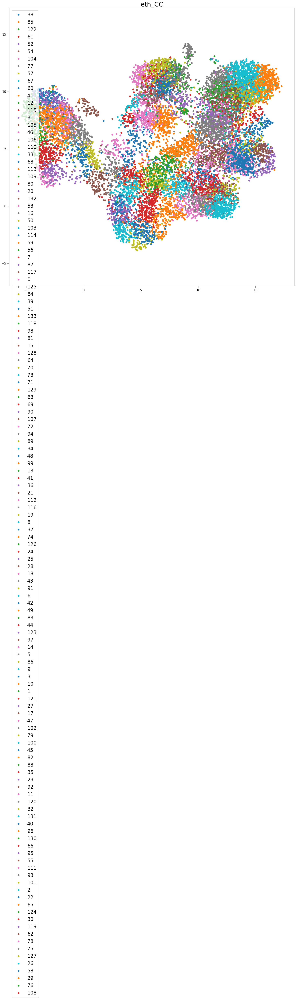

In [8]:
fig, ax = plt.subplots(1, figsize=(24,24))
plot_points(embedding, dataset, ax, labels)
plt.show()

In [9]:
np.argsort([1,2,36])

0 not in [1,2,3]

True

In [10]:
components = []
node_labels = [None for _ in range(number_of_nodes)]
for label in np.sort(unique_labels):
    component = np.argwhere(label == labels).T
    assert len(component) == 1
    
    for node in component[0]:
        node_labels[node] = label
        
    components.append(component[0].tolist())

sub_ICTs = []

# Put the clusters with #nodes < threshold to the cluster of the nearest node
# PCA since clusters are computed in pca space!
distances = pairwise_distances(pca, pca)

cleaned_components = [False for _ in range(len(unique_labels))]

while True:
    
    for idx, component in enumerate(components):
        
        if cleaned_components[idx] == True:
            continue
        
        if len(component) <= threshold:
            
            for node in component:
                nearests = np.argsort(distances[node])
                for elem in nearests:
                    if elem not in component:
                        nearest = elem
                node_labels[node] = node_labels[nearest]
                components[node_labels[nearest]].append(node)
                cleaned_components[idx] = True
                continue
    
    break

new_components = []
new_node_labels = [None for _ in range(number_of_nodes)]
    
for idx, component in enumerate(components):
    if cleaned_components[idx] == False:
        new_components.append(component)
        for node in component:
            new_node_labels[node] = idx
            
unique_labels = np.unique(new_node_labels)
components = new_components
node_labels = new_node_labels



for component in tqdm(components):
    
    sub_number_of_nodes = len(component)
    
    sub_G, _ = create_graph(sub_number_of_nodes, mode, position=pca[component], k=11,
                            beta=2, delta=0.5, bridges=4)
    sub_G.indexEdges()

    sub_ICT = calculate_ICT(sub_G, algorithm_type="exact_own",
                                   zeros_stay_zeros=True, update_G=1.1)
    sub_ICT.indexEdges()
    sub_ICTs.append(sub_ICT)

  0%|          | 0/81 [00:00<?, ?it/s]

calculating the densities for the density criterion:   0%|          | 0/203 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1983 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1983 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1983 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/202 [00:00<?, ?it/s]

update Arr 1983 -> 1728
added 5 edges early
update Arr 1728 -> 1541
update Arr 1541 -> 1396
update Arr 1396 -> 1262
update Arr 1262 -> 1147
update Arr 1147 -> 1039
update Arr 1039 -> 938
update Arr 938 -> 848
update Arr 848 -> 768
update Arr 768 -> 698
update Arr 698 -> 630
update Arr 630 -> 571
update Arr 571 -> 515
update Arr 515 -> 465
update Arr 465 -> 418
update Arr 418 -> 379
update Arr 379 -> 343
update Arr 343 -> 309
update Arr 309 -> 280
update Arr 280 -> 252
update Arr 252 -> 228
update Arr 228 -> 211
update Arr 211 -> 210
update Arr 210 -> 209
update Arr 209 -> 208
update Arr 208 -> 206
update Arr 206 -> 203
update Arr 203 -> 203


calculating the densities for the density criterion:   0%|          | 0/467 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/4687 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/4687 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/4687 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/466 [00:00<?, ?it/s]

update Arr 4687 -> 4234
added 4 edges early
update Arr 4234 -> 3811
update Arr 3811 -> 3460
update Arr 3460 -> 3138
update Arr 3138 -> 2852
update Arr 2852 -> 2587
update Arr 2587 -> 2351
update Arr 2351 -> 2137
update Arr 2137 -> 1933
update Arr 1933 -> 1748
update Arr 1748 -> 1584
update Arr 1584 -> 1438
update Arr 1438 -> 1299
update Arr 1299 -> 1179
update Arr 1179 -> 1071
update Arr 1071 -> 972
update Arr 972 -> 883
update Arr 883 -> 801
update Arr 801 -> 717
update Arr 717 -> 648
update Arr 648 -> 589
update Arr 589 -> 534
update Arr 534 -> 481
added 6 edges early
update Arr 481 -> 476
update Arr 476 -> 474
update Arr 474 -> 473
update Arr 473 -> 471
update Arr 471 -> 470
update Arr 470 -> 470
update Arr 470 -> 468
update Arr 468 -> 468
update Arr 468 -> 467


calculating the densities for the density criterion:   0%|          | 0/124 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1193 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1193 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1193 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/123 [00:00<?, ?it/s]

update Arr 1193 -> 1072
added 3 edges early
update Arr 1072 -> 969
update Arr 969 -> 843
update Arr 843 -> 764
update Arr 764 -> 687
update Arr 687 -> 617
update Arr 617 -> 554
update Arr 554 -> 503
update Arr 503 -> 450
update Arr 450 -> 408
update Arr 408 -> 362
update Arr 362 -> 324
update Arr 324 -> 289
update Arr 289 -> 259
update Arr 259 -> 227
update Arr 227 -> 205
update Arr 205 -> 182
update Arr 182 -> 163
update Arr 163 -> 145
update Arr 145 -> 130
update Arr 130 -> 127
update Arr 127 -> 125
update Arr 125 -> 124


calculating the densities for the density criterion:   0%|          | 0/217 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2138 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/216 [00:00<?, ?it/s]

update Arr 2138 -> 1907
update Arr 1907 -> 1730
update Arr 1730 -> 1567
update Arr 1567 -> 1415
update Arr 1415 -> 1286
update Arr 1286 -> 1168
update Arr 1168 -> 1061
update Arr 1061 -> 958
update Arr 958 -> 865
update Arr 865 -> 780
update Arr 780 -> 706
update Arr 706 -> 638
update Arr 638 -> 578
update Arr 578 -> 520
update Arr 520 -> 471
update Arr 471 -> 427
update Arr 427 -> 385
update Arr 385 -> 341
update Arr 341 -> 309
update Arr 309 -> 277
update Arr 277 -> 251
update Arr 251 -> 226
update Arr 226 -> 225
update Arr 225 -> 224
update Arr 224 -> 224
update Arr 224 -> 223
update Arr 223 -> 222
update Arr 222 -> 221
update Arr 221 -> 219
update Arr 219 -> 217


calculating the densities for the density criterion:   0%|          | 0/451 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/4393 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/4393 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/4393 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/450 [00:00<?, ?it/s]

update Arr 4393 -> 3963
added 3 edges early
update Arr 3963 -> 3602
update Arr 3602 -> 3244
update Arr 3244 -> 2929
update Arr 2929 -> 2656
update Arr 2656 -> 2403
update Arr 2403 -> 2180
update Arr 2180 -> 1980
update Arr 1980 -> 1796
update Arr 1796 -> 1629
update Arr 1629 -> 1474
update Arr 1474 -> 1336
update Arr 1336 -> 1209
update Arr 1209 -> 1094
update Arr 1094 -> 992
update Arr 992 -> 894
update Arr 894 -> 810
update Arr 810 -> 733
update Arr 733 -> 663
update Arr 663 -> 600
update Arr 600 -> 543
update Arr 543 -> 492
update Arr 492 -> 454
added 3 edges early
update Arr 454 -> 454
update Arr 454 -> 453
update Arr 453 -> 452
update Arr 452 -> 452
update Arr 452 -> 451


calculating the densities for the density criterion:   0%|          | 0/146 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1408 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1408 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1408 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/145 [00:00<?, ?it/s]

update Arr 1408 -> 1273
update Arr 1273 -> 1154
update Arr 1154 -> 1049
update Arr 1049 -> 945
update Arr 945 -> 859
update Arr 859 -> 775
update Arr 775 -> 701
update Arr 701 -> 634
update Arr 634 -> 573
update Arr 573 -> 519
update Arr 519 -> 465
update Arr 465 -> 421
update Arr 421 -> 381
update Arr 381 -> 343
update Arr 343 -> 310
update Arr 310 -> 278
update Arr 278 -> 252
update Arr 252 -> 225
update Arr 225 -> 204
update Arr 204 -> 179
update Arr 179 -> 162
update Arr 162 -> 155
update Arr 155 -> 151
update Arr 151 -> 150
update Arr 150 -> 147
update Arr 147 -> 147
update Arr 147 -> 146
update Arr 146 -> 146


calculating the densities for the density criterion:   0%|          | 0/47 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/425 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/425 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/425 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/46 [00:00<?, ?it/s]

update Arr 425 -> 384
update Arr 384 -> 346
update Arr 346 -> 311
update Arr 311 -> 280
update Arr 280 -> 254
update Arr 254 -> 228
update Arr 228 -> 207
update Arr 207 -> 181
update Arr 181 -> 163
update Arr 163 -> 140
update Arr 140 -> 118
update Arr 118 -> 107
update Arr 107 -> 94
update Arr 94 -> 77
update Arr 77 -> 67
update Arr 67 -> 56
update Arr 56 -> 52
update Arr 52 -> 50
update Arr 50 -> 49
update Arr 49 -> 48


calculating the densities for the density criterion:   0%|          | 0/434 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/4383 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/4383 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/4383 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/433 [00:00<?, ?it/s]

update Arr 4383 -> 3965
added 6 edges early
update Arr 3965 -> 3595
update Arr 3595 -> 3144
update Arr 3144 -> 2854
update Arr 2854 -> 2592
update Arr 2592 -> 2352
update Arr 2352 -> 2138
update Arr 2138 -> 1936
update Arr 1936 -> 1758
update Arr 1758 -> 1596
update Arr 1596 -> 1440
update Arr 1440 -> 1298
update Arr 1298 -> 1178
update Arr 1178 -> 1069
update Arr 1069 -> 958
update Arr 958 -> 868
update Arr 868 -> 789
update Arr 789 -> 713
update Arr 713 -> 644
update Arr 644 -> 581
update Arr 581 -> 528
update Arr 528 -> 477
update Arr 477 -> 440
update Arr 440 -> 439
update Arr 439 -> 436
update Arr 436 -> 435
update Arr 435 -> 434


calculating the densities for the density criterion:   0%|          | 0/276 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2667 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2667 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2667 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/275 [00:00<?, ?it/s]

update Arr 2667 -> 2391
added 3 edges early
update Arr 2391 -> 2162
update Arr 2162 -> 1962
update Arr 1962 -> 1783
update Arr 1783 -> 1614
update Arr 1614 -> 1462
update Arr 1462 -> 1328
update Arr 1328 -> 1202
update Arr 1202 -> 1082
update Arr 1082 -> 977
update Arr 977 -> 884
update Arr 884 -> 797
update Arr 797 -> 724
update Arr 724 -> 652
update Arr 652 -> 589
update Arr 589 -> 525
update Arr 525 -> 465
update Arr 465 -> 419
update Arr 419 -> 379
update Arr 379 -> 342
update Arr 342 -> 300
update Arr 300 -> 283
update Arr 283 -> 281
update Arr 281 -> 280
update Arr 280 -> 279
update Arr 279 -> 277
update Arr 277 -> 276


calculating the densities for the density criterion:   0%|          | 0/93 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/910 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/910 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/910 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/92 [00:00<?, ?it/s]

update Arr 910 -> 820
update Arr 820 -> 735
update Arr 735 -> 665
update Arr 665 -> 604
update Arr 604 -> 531
update Arr 531 -> 482
update Arr 482 -> 433
update Arr 433 -> 392
update Arr 392 -> 350
update Arr 350 -> 305
update Arr 305 -> 270
update Arr 270 -> 243
update Arr 243 -> 210
update Arr 210 -> 182
update Arr 182 -> 159
update Arr 159 -> 141
update Arr 141 -> 127
update Arr 127 -> 110
update Arr 110 -> 102
update Arr 102 -> 101
update Arr 101 -> 100
update Arr 100 -> 96
update Arr 96 -> 95
update Arr 95 -> 94
update Arr 94 -> 93


calculating the densities for the density criterion:   0%|          | 0/259 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2562 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2562 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2562 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/258 [00:00<?, ?it/s]

update Arr 2562 -> 2289
update Arr 2289 -> 2078
update Arr 2078 -> 1882
update Arr 1882 -> 1704
update Arr 1704 -> 1545
update Arr 1545 -> 1400
update Arr 1400 -> 1265
update Arr 1265 -> 1148
update Arr 1148 -> 1035
update Arr 1035 -> 938
update Arr 938 -> 849
update Arr 849 -> 767
update Arr 767 -> 684
update Arr 684 -> 614
update Arr 614 -> 555
update Arr 555 -> 501
update Arr 501 -> 455
update Arr 455 -> 413
update Arr 413 -> 374
update Arr 374 -> 338
update Arr 338 -> 304
update Arr 304 -> 276
update Arr 276 -> 268
update Arr 268 -> 267
update Arr 267 -> 264
update Arr 264 -> 263
update Arr 263 -> 262
update Arr 262 -> 261
update Arr 261 -> 260
update Arr 260 -> 259


calculating the densities for the density criterion:   0%|          | 0/132 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1316 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1316 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1316 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/131 [00:00<?, ?it/s]

update Arr 1316 -> 1189
added 5 edges early
update Arr 1189 -> 1049
update Arr 1049 -> 950
update Arr 950 -> 856
update Arr 856 -> 778
update Arr 778 -> 703
update Arr 703 -> 637
update Arr 637 -> 572
update Arr 572 -> 519
update Arr 519 -> 464
update Arr 464 -> 419
update Arr 419 -> 372
update Arr 372 -> 337
update Arr 337 -> 306
update Arr 306 -> 278
update Arr 278 -> 238
update Arr 238 -> 214
update Arr 214 -> 192
update Arr 192 -> 173
update Arr 173 -> 157
update Arr 157 -> 140
update Arr 140 -> 140
update Arr 140 -> 139
update Arr 139 -> 138
update Arr 138 -> 135
update Arr 135 -> 133
update Arr 133 -> 132


calculating the densities for the density criterion:   0%|          | 0/124 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1095 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1095 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1095 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/123 [00:00<?, ?it/s]

update Arr 1095 -> 990
update Arr 990 -> 882
update Arr 882 -> 792
update Arr 792 -> 719
update Arr 719 -> 651
update Arr 651 -> 585
update Arr 585 -> 526
update Arr 526 -> 474
update Arr 474 -> 421
update Arr 421 -> 381
update Arr 381 -> 346
update Arr 346 -> 307
update Arr 307 -> 271
update Arr 271 -> 246
update Arr 246 -> 220
update Arr 220 -> 197
update Arr 197 -> 170
update Arr 170 -> 150
update Arr 150 -> 136
update Arr 136 -> 131
update Arr 131 -> 130
update Arr 130 -> 126
update Arr 126 -> 126
update Arr 126 -> 125
update Arr 125 -> 124


calculating the densities for the density criterion:   0%|          | 0/223 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2176 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2176 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2176 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/222 [00:00<?, ?it/s]

update Arr 2176 -> 1940
added 4 edges early
update Arr 1940 -> 1749
update Arr 1749 -> 1588
update Arr 1588 -> 1436
update Arr 1436 -> 1298
update Arr 1298 -> 1175
update Arr 1175 -> 1065
update Arr 1065 -> 964
update Arr 964 -> 875
update Arr 875 -> 791
update Arr 791 -> 719
update Arr 719 -> 653
update Arr 653 -> 587
update Arr 587 -> 528
update Arr 528 -> 472
update Arr 472 -> 427
update Arr 427 -> 381
update Arr 381 -> 344
update Arr 344 -> 311
update Arr 311 -> 281
update Arr 281 -> 253
update Arr 253 -> 229
update Arr 229 -> 229
update Arr 229 -> 227
update Arr 227 -> 225
update Arr 225 -> 222


calculating the densities for the density criterion:   0%|          | 0/244 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2444 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2444 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2444 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/243 [00:00<?, ?it/s]

update Arr 2444 -> 2216
added 5 edges early
update Arr 2216 -> 1986
update Arr 1986 -> 1798
update Arr 1798 -> 1631
update Arr 1631 -> 1482
update Arr 1482 -> 1344
update Arr 1344 -> 1220
update Arr 1220 -> 1108
update Arr 1108 -> 1003
update Arr 1003 -> 906
update Arr 906 -> 821
update Arr 821 -> 740
update Arr 740 -> 670
update Arr 670 -> 604
update Arr 604 -> 549
update Arr 549 -> 498
update Arr 498 -> 447
update Arr 447 -> 406
update Arr 406 -> 363
update Arr 363 -> 325
update Arr 325 -> 291
update Arr 291 -> 263
update Arr 263 -> 251
update Arr 251 -> 249
update Arr 249 -> 247
update Arr 247 -> 245


calculating the densities for the density criterion:   0%|          | 0/71 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/660 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/660 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/660 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/70 [00:00<?, ?it/s]

update Arr 660 -> 595
update Arr 595 -> 527
update Arr 527 -> 457
update Arr 457 -> 410
update Arr 410 -> 361
update Arr 361 -> 326
update Arr 326 -> 288
update Arr 288 -> 256
update Arr 256 -> 229
update Arr 229 -> 205
update Arr 205 -> 172
update Arr 172 -> 154
update Arr 154 -> 139
update Arr 139 -> 123
update Arr 123 -> 107
update Arr 107 -> 96
update Arr 96 -> 87
update Arr 87 -> 78
update Arr 78 -> 75
update Arr 75 -> 73
update Arr 73 -> 72


calculating the densities for the density criterion:   0%|          | 0/155 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1448 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1448 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1448 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/154 [00:00<?, ?it/s]

update Arr 1448 -> 1310
update Arr 1310 -> 1189
update Arr 1189 -> 1071
update Arr 1071 -> 967
update Arr 967 -> 878
update Arr 878 -> 794
update Arr 794 -> 717
update Arr 717 -> 646
update Arr 646 -> 586
update Arr 586 -> 532
update Arr 532 -> 482
update Arr 482 -> 437
update Arr 437 -> 392
update Arr 392 -> 356
update Arr 356 -> 318
update Arr 318 -> 282
update Arr 282 -> 255
update Arr 255 -> 230
update Arr 230 -> 204
update Arr 204 -> 182
update Arr 182 -> 165
update Arr 165 -> 164
update Arr 164 -> 163
update Arr 163 -> 159
update Arr 159 -> 158
update Arr 158 -> 155
update Arr 155 -> 155


calculating the densities for the density criterion:   0%|          | 0/309 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3039 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3039 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3039 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/308 [00:00<?, ?it/s]

update Arr 3039 -> 2743
update Arr 2743 -> 2369
update Arr 2369 -> 2095
update Arr 2095 -> 1903
update Arr 1903 -> 1729
update Arr 1729 -> 1568
update Arr 1568 -> 1423
update Arr 1423 -> 1293
update Arr 1293 -> 1170
update Arr 1170 -> 1063
update Arr 1063 -> 957
update Arr 957 -> 867
update Arr 867 -> 785
update Arr 785 -> 711
update Arr 711 -> 644
update Arr 644 -> 585
update Arr 585 -> 530
update Arr 530 -> 480
update Arr 480 -> 435
update Arr 435 -> 392
update Arr 392 -> 354
update Arr 354 -> 321
update Arr 321 -> 318
update Arr 318 -> 316
update Arr 316 -> 314
update Arr 314 -> 313
update Arr 313 -> 312
update Arr 312 -> 310
update Arr 310 -> 309


calculating the densities for the density criterion:   0%|          | 0/343 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3409 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3409 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3409 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/342 [00:00<?, ?it/s]

update Arr 3409 -> 3038
added 4 edges early
update Arr 3038 -> 2694
update Arr 2694 -> 2414
update Arr 2414 -> 2185
update Arr 2185 -> 1984
update Arr 1984 -> 1797
update Arr 1797 -> 1627
update Arr 1627 -> 1473
update Arr 1473 -> 1328
update Arr 1328 -> 1206
update Arr 1206 -> 1087
update Arr 1087 -> 980
update Arr 980 -> 883
update Arr 883 -> 800
update Arr 800 -> 724
update Arr 724 -> 651
update Arr 651 -> 591
update Arr 591 -> 534
update Arr 534 -> 483
update Arr 483 -> 437
update Arr 437 -> 396
update Arr 396 -> 358
update Arr 358 -> 352
update Arr 352 -> 350
update Arr 350 -> 348
update Arr 348 -> 346
update Arr 346 -> 345
update Arr 345 -> 344
update Arr 344 -> 343


calculating the densities for the density criterion:   0%|          | 0/83 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/814 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/814 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/814 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/82 [00:00<?, ?it/s]

update Arr 814 -> 733
added 4 edges early
update Arr 733 -> 666
update Arr 666 -> 571
update Arr 571 -> 477
update Arr 477 -> 428
update Arr 428 -> 373
update Arr 373 -> 314
update Arr 314 -> 284
update Arr 284 -> 255
update Arr 255 -> 231
update Arr 231 -> 207
update Arr 207 -> 187
update Arr 187 -> 168
update Arr 168 -> 152
update Arr 152 -> 136
update Arr 136 -> 122
update Arr 122 -> 106
update Arr 106 -> 95
update Arr 95 -> 91
update Arr 91 -> 87
update Arr 87 -> 85
update Arr 85 -> 83
update Arr 83 -> 83


calculating the densities for the density criterion:   0%|          | 0/137 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1302 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1302 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1302 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/136 [00:00<?, ?it/s]

update Arr 1302 -> 1173
update Arr 1173 -> 1033
update Arr 1033 -> 926
update Arr 926 -> 829
update Arr 829 -> 750
update Arr 750 -> 681
update Arr 681 -> 619
update Arr 619 -> 562
update Arr 562 -> 508
update Arr 508 -> 454
update Arr 454 -> 406
update Arr 406 -> 362
update Arr 362 -> 323
update Arr 323 -> 282
update Arr 282 -> 254
update Arr 254 -> 225
update Arr 225 -> 203
update Arr 203 -> 184
update Arr 184 -> 166
update Arr 166 -> 147
update Arr 147 -> 146
update Arr 146 -> 144
update Arr 144 -> 139
update Arr 139 -> 139
update Arr 139 -> 137


calculating the densities for the density criterion:   0%|          | 0/128 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1266 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1266 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1266 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/127 [00:00<?, ?it/s]

update Arr 1266 -> 1121
update Arr 1121 -> 1009
update Arr 1009 -> 914
update Arr 914 -> 827
update Arr 827 -> 735
update Arr 735 -> 662
update Arr 662 -> 596
update Arr 596 -> 540
update Arr 540 -> 482
update Arr 482 -> 437
update Arr 437 -> 389
update Arr 389 -> 347
update Arr 347 -> 308
update Arr 308 -> 277
update Arr 277 -> 248
update Arr 248 -> 224
update Arr 224 -> 200
update Arr 200 -> 181
update Arr 181 -> 163
update Arr 163 -> 148
update Arr 148 -> 136
update Arr 136 -> 135
update Arr 135 -> 133
update Arr 133 -> 132
update Arr 132 -> 130
update Arr 130 -> 129


calculating the densities for the density criterion:   0%|          | 0/216 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2033 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2033 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2033 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/215 [00:00<?, ?it/s]

update Arr 2033 -> 1827
update Arr 1827 -> 1645
update Arr 1645 -> 1486
update Arr 1486 -> 1348
update Arr 1348 -> 1218
update Arr 1218 -> 1107
update Arr 1107 -> 1002
update Arr 1002 -> 909
update Arr 909 -> 824
update Arr 824 -> 736
update Arr 736 -> 669
update Arr 669 -> 601
update Arr 601 -> 540
update Arr 540 -> 486
update Arr 486 -> 436
update Arr 436 -> 383
update Arr 383 -> 338
update Arr 338 -> 304
update Arr 304 -> 276
update Arr 276 -> 246
update Arr 246 -> 224
update Arr 224 -> 223
update Arr 223 -> 221
update Arr 221 -> 218
update Arr 218 -> 217


calculating the densities for the density criterion:   0%|          | 0/83 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/780 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/780 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/780 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/82 [00:00<?, ?it/s]

update Arr 780 -> 707
update Arr 707 -> 640
update Arr 640 -> 577
update Arr 577 -> 518
update Arr 518 -> 461
update Arr 461 -> 405
update Arr 405 -> 368
update Arr 368 -> 327
update Arr 327 -> 289
update Arr 289 -> 258
update Arr 258 -> 231
update Arr 231 -> 203
update Arr 203 -> 176
update Arr 176 -> 157
update Arr 157 -> 138
update Arr 138 -> 120
update Arr 120 -> 108
update Arr 108 -> 97
update Arr 97 -> 92
update Arr 92 -> 92
update Arr 92 -> 90
update Arr 90 -> 85
update Arr 85 -> 85
update Arr 85 -> 83


calculating the densities for the density criterion:   0%|          | 0/116 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1114 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1114 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1114 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/115 [00:00<?, ?it/s]

update Arr 1114 -> 1012
update Arr 1012 -> 918
update Arr 918 -> 831
update Arr 831 -> 754
update Arr 754 -> 678
update Arr 678 -> 577
update Arr 577 -> 521
update Arr 521 -> 467
update Arr 467 -> 424
update Arr 424 -> 378
update Arr 378 -> 336
update Arr 336 -> 300
update Arr 300 -> 266
update Arr 266 -> 236
update Arr 236 -> 212
update Arr 212 -> 190
update Arr 190 -> 171
update Arr 171 -> 152
update Arr 152 -> 134
update Arr 134 -> 122
update Arr 122 -> 121
update Arr 121 -> 119
update Arr 119 -> 118
update Arr 118 -> 116
update Arr 116 -> 115


calculating the densities for the density criterion:   0%|          | 0/155 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1555 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1555 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1555 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/154 [00:00<?, ?it/s]

update Arr 1555 -> 1413
update Arr 1413 -> 1276
update Arr 1276 -> 1110
update Arr 1110 -> 999
update Arr 999 -> 876
update Arr 876 -> 795
update Arr 795 -> 719
update Arr 719 -> 653
update Arr 653 -> 591
update Arr 591 -> 532
update Arr 532 -> 479
update Arr 479 -> 432
update Arr 432 -> 383
update Arr 383 -> 345
update Arr 345 -> 309
update Arr 309 -> 279
update Arr 279 -> 250
update Arr 250 -> 227
update Arr 227 -> 206
update Arr 206 -> 187
update Arr 187 -> 169
update Arr 169 -> 164
update Arr 164 -> 163
update Arr 163 -> 162
update Arr 162 -> 161
update Arr 161 -> 157
update Arr 157 -> 157
update Arr 157 -> 156
update Arr 156 -> 155


calculating the densities for the density criterion:   0%|          | 0/174 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1688 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1688 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1688 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/173 [00:00<?, ?it/s]

update Arr 1688 -> 1527
update Arr 1527 -> 1341
update Arr 1341 -> 1200
update Arr 1200 -> 1090
update Arr 1090 -> 976
update Arr 976 -> 883
update Arr 883 -> 799
update Arr 799 -> 726
update Arr 726 -> 652
update Arr 652 -> 592
update Arr 592 -> 532
update Arr 532 -> 477
update Arr 477 -> 432
update Arr 432 -> 392
update Arr 392 -> 355
update Arr 355 -> 322
update Arr 322 -> 288
update Arr 288 -> 259
update Arr 259 -> 234
update Arr 234 -> 212
update Arr 212 -> 191
update Arr 191 -> 183
update Arr 183 -> 181
update Arr 181 -> 179
update Arr 179 -> 177
update Arr 177 -> 175
update Arr 175 -> 174


calculating the densities for the density criterion:   0%|          | 0/171 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1618 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1618 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1618 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/170 [00:00<?, ?it/s]

update Arr 1618 -> 1454
added 2 edges early
update Arr 1454 -> 1311
update Arr 1311 -> 1184
update Arr 1184 -> 1076
update Arr 1076 -> 974
update Arr 974 -> 882
update Arr 882 -> 798
update Arr 798 -> 717
update Arr 717 -> 650
update Arr 650 -> 582
update Arr 582 -> 524
update Arr 524 -> 473
update Arr 473 -> 426
update Arr 426 -> 385
update Arr 385 -> 348
update Arr 348 -> 309
update Arr 309 -> 277
update Arr 277 -> 248
update Arr 248 -> 223
update Arr 223 -> 200
update Arr 200 -> 179
update Arr 179 -> 175
update Arr 175 -> 175
update Arr 175 -> 173
update Arr 173 -> 171
update Arr 171 -> 170


calculating the densities for the density criterion:   0%|          | 0/219 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2174 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2174 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2174 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/218 [00:00<?, ?it/s]

update Arr 2174 -> 1971
added 3 edges early
update Arr 1971 -> 1754
update Arr 1754 -> 1593
update Arr 1593 -> 1424
update Arr 1424 -> 1292
update Arr 1292 -> 1168
update Arr 1168 -> 1060
update Arr 1060 -> 959
update Arr 959 -> 867
update Arr 867 -> 783
update Arr 783 -> 709
update Arr 709 -> 637
update Arr 637 -> 574
update Arr 574 -> 517
update Arr 517 -> 469
update Arr 469 -> 425
update Arr 425 -> 385
update Arr 385 -> 347
update Arr 347 -> 314
update Arr 314 -> 276
update Arr 276 -> 250
update Arr 250 -> 227
update Arr 227 -> 226
update Arr 226 -> 225
update Arr 225 -> 222
update Arr 222 -> 221
update Arr 221 -> 219


calculating the densities for the density criterion:   0%|          | 0/340 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3333 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3333 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3333 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/339 [00:00<?, ?it/s]

update Arr 3333 -> 3006
update Arr 3006 -> 2689
update Arr 2689 -> 2422
update Arr 2422 -> 2201
update Arr 2201 -> 1999
update Arr 1999 -> 1817
update Arr 1817 -> 1651
update Arr 1651 -> 1494
update Arr 1494 -> 1354
update Arr 1354 -> 1225
update Arr 1225 -> 1112
update Arr 1112 -> 1005
update Arr 1005 -> 912
update Arr 912 -> 829
update Arr 829 -> 749
update Arr 749 -> 680
update Arr 680 -> 615
update Arr 615 -> 550
update Arr 550 -> 499
update Arr 499 -> 453
update Arr 453 -> 410
update Arr 410 -> 370
update Arr 370 -> 348
update Arr 348 -> 347
update Arr 347 -> 346
update Arr 346 -> 345
update Arr 345 -> 340
update Arr 340 -> 340


calculating the densities for the density criterion:   0%|          | 0/144 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1400 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1400 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1400 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/143 [00:00<?, ?it/s]

update Arr 1400 -> 1262
added 4 edges early
update Arr 1262 -> 1103
update Arr 1103 -> 1001
update Arr 1001 -> 903
update Arr 903 -> 817
update Arr 817 -> 742
update Arr 742 -> 672
update Arr 672 -> 610
update Arr 610 -> 549
update Arr 549 -> 499
update Arr 499 -> 451
update Arr 451 -> 395
update Arr 395 -> 359
update Arr 359 -> 320
update Arr 320 -> 284
update Arr 284 -> 253
update Arr 253 -> 228
update Arr 228 -> 207
update Arr 207 -> 186
update Arr 186 -> 169
update Arr 169 -> 153
update Arr 153 -> 148
update Arr 148 -> 148
update Arr 148 -> 146
update Arr 146 -> 145
update Arr 145 -> 144


calculating the densities for the density criterion:   0%|          | 0/215 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2046 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2046 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2046 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/214 [00:00<?, ?it/s]

update Arr 2046 -> 1851
added 5 edges early
update Arr 1851 -> 1669
update Arr 1669 -> 1514
update Arr 1514 -> 1373
update Arr 1373 -> 1247
update Arr 1247 -> 1128
update Arr 1128 -> 1021
update Arr 1021 -> 928
update Arr 928 -> 838
update Arr 838 -> 758
update Arr 758 -> 688
update Arr 688 -> 614
update Arr 614 -> 549
update Arr 549 -> 493
update Arr 493 -> 444
update Arr 444 -> 397
update Arr 397 -> 359
update Arr 359 -> 322
update Arr 322 -> 288
update Arr 288 -> 261
update Arr 261 -> 236
update Arr 236 -> 224
update Arr 224 -> 222
update Arr 222 -> 221
update Arr 221 -> 220
update Arr 220 -> 218


calculating the densities for the density criterion:   0%|          | 0/54 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/504 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/504 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/504 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/53 [00:00<?, ?it/s]

update Arr 504 -> 453
update Arr 453 -> 409
update Arr 409 -> 362
update Arr 362 -> 318
update Arr 318 -> 286
update Arr 286 -> 252
update Arr 252 -> 223
update Arr 223 -> 196
update Arr 196 -> 173
update Arr 173 -> 157
update Arr 157 -> 139
update Arr 139 -> 124
update Arr 124 -> 111
update Arr 111 -> 93
update Arr 93 -> 83
update Arr 83 -> 69
update Arr 69 -> 61
update Arr 61 -> 57
update Arr 57 -> 56
update Arr 56 -> 54
update Arr 54 -> 53


calculating the densities for the density criterion:   0%|          | 0/73 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/643 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/643 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/643 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/72 [00:00<?, ?it/s]

update Arr 643 -> 565
update Arr 565 -> 509
update Arr 509 -> 462
update Arr 462 -> 416
update Arr 416 -> 374
update Arr 374 -> 336
update Arr 336 -> 300
update Arr 300 -> 268
update Arr 268 -> 238
update Arr 238 -> 214
update Arr 214 -> 191
update Arr 191 -> 171
update Arr 171 -> 155
update Arr 155 -> 135
update Arr 135 -> 117
update Arr 117 -> 102
update Arr 102 -> 90
update Arr 90 -> 82
update Arr 82 -> 80
update Arr 80 -> 76
update Arr 76 -> 76
update Arr 76 -> 74
update Arr 74 -> 73


calculating the densities for the density criterion:   0%|          | 0/96 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/879 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/879 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/879 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/95 [00:00<?, ?it/s]

update Arr 879 -> 789
update Arr 789 -> 713
update Arr 713 -> 646
update Arr 646 -> 586
update Arr 586 -> 527
update Arr 527 -> 471
update Arr 471 -> 426
update Arr 426 -> 381
update Arr 381 -> 340
update Arr 340 -> 306
update Arr 306 -> 273
update Arr 273 -> 246
update Arr 246 -> 221
update Arr 221 -> 199
update Arr 199 -> 174
update Arr 174 -> 158
update Arr 158 -> 140
update Arr 140 -> 121
update Arr 121 -> 109
update Arr 109 -> 103
update Arr 103 -> 100
update Arr 100 -> 97
update Arr 97 -> 95


calculating the densities for the density criterion:   0%|          | 0/208 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1944 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1944 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1944 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/207 [00:00<?, ?it/s]

update Arr 1944 -> 1740
added 2 edges early
update Arr 1740 -> 1573
update Arr 1573 -> 1367
update Arr 1367 -> 1238
update Arr 1238 -> 1123
update Arr 1123 -> 1020
update Arr 1020 -> 925
update Arr 925 -> 832
update Arr 832 -> 756
update Arr 756 -> 686
update Arr 686 -> 622
update Arr 622 -> 562
update Arr 562 -> 508
update Arr 508 -> 454
update Arr 454 -> 412
update Arr 412 -> 374
update Arr 374 -> 335
update Arr 335 -> 303
update Arr 303 -> 274
update Arr 274 -> 243
update Arr 243 -> 219
update Arr 219 -> 215
update Arr 215 -> 212
update Arr 212 -> 211
update Arr 211 -> 210
update Arr 210 -> 209
update Arr 209 -> 208


calculating the densities for the density criterion:   0%|          | 0/64 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/541 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/541 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/541 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/63 [00:00<?, ?it/s]

update Arr 541 -> 490
update Arr 490 -> 438
update Arr 438 -> 394
update Arr 394 -> 358
update Arr 358 -> 323
update Arr 323 -> 292
update Arr 292 -> 262
update Arr 262 -> 236
update Arr 236 -> 206
update Arr 206 -> 180
update Arr 180 -> 160
update Arr 160 -> 145
update Arr 145 -> 125
update Arr 125 -> 107
update Arr 107 -> 97
update Arr 97 -> 85
update Arr 85 -> 76
update Arr 76 -> 71
update Arr 71 -> 68
update Arr 68 -> 66
update Arr 66 -> 64


calculating the densities for the density criterion:   0%|          | 0/175 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1721 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1721 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1721 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/174 [00:00<?, ?it/s]

update Arr 1721 -> 1556
update Arr 1556 -> 1407
update Arr 1407 -> 1243
update Arr 1243 -> 1122
update Arr 1122 -> 1015
update Arr 1015 -> 922
update Arr 922 -> 836
update Arr 836 -> 758
update Arr 758 -> 684
update Arr 684 -> 617
update Arr 617 -> 543
update Arr 543 -> 481
update Arr 481 -> 433
update Arr 433 -> 393
update Arr 393 -> 349
update Arr 349 -> 314
update Arr 314 -> 285
update Arr 285 -> 255
update Arr 255 -> 231
update Arr 231 -> 208
update Arr 208 -> 189
update Arr 189 -> 183
update Arr 183 -> 181
update Arr 181 -> 178
update Arr 178 -> 177
update Arr 177 -> 175


calculating the densities for the density criterion:   0%|          | 0/98 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/859 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/859 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/859 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/97 [00:00<?, ?it/s]

update Arr 859 -> 759
update Arr 759 -> 686
update Arr 686 -> 623
update Arr 623 -> 564
update Arr 564 -> 509
update Arr 509 -> 461
update Arr 461 -> 419
update Arr 419 -> 380
update Arr 380 -> 342
update Arr 342 -> 306
update Arr 306 -> 278
update Arr 278 -> 252
update Arr 252 -> 229
update Arr 229 -> 206
update Arr 206 -> 186
update Arr 186 -> 162
update Arr 162 -> 144
update Arr 144 -> 124
update Arr 124 -> 109
update Arr 109 -> 106
update Arr 106 -> 103
update Arr 103 -> 101
update Arr 101 -> 99
update Arr 99 -> 98


calculating the densities for the density criterion:   0%|          | 0/131 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1220 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1220 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1220 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/130 [00:00<?, ?it/s]

update Arr 1220 -> 1108
update Arr 1108 -> 1000
update Arr 1000 -> 889
update Arr 889 -> 808
update Arr 808 -> 732
update Arr 732 -> 664
update Arr 664 -> 597
update Arr 597 -> 539
update Arr 539 -> 487
update Arr 487 -> 437
update Arr 437 -> 394
update Arr 394 -> 358
update Arr 358 -> 325
update Arr 325 -> 294
update Arr 294 -> 267
update Arr 267 -> 241
update Arr 241 -> 215
update Arr 215 -> 195
update Arr 195 -> 175
update Arr 175 -> 158
update Arr 158 -> 143
update Arr 143 -> 140
update Arr 140 -> 133
update Arr 133 -> 133
update Arr 133 -> 132
update Arr 132 -> 130


calculating the densities for the density criterion:   0%|          | 0/126 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1230 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1230 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1230 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/125 [00:00<?, ?it/s]

update Arr 1230 -> 1104
update Arr 1104 -> 994
update Arr 994 -> 890
update Arr 890 -> 803
update Arr 803 -> 721
update Arr 721 -> 643
update Arr 643 -> 572
update Arr 572 -> 516
update Arr 516 -> 450
update Arr 450 -> 405
update Arr 405 -> 368
update Arr 368 -> 333
update Arr 333 -> 302
update Arr 302 -> 270
update Arr 270 -> 245
update Arr 245 -> 220
update Arr 220 -> 193
update Arr 193 -> 165
update Arr 165 -> 138
update Arr 138 -> 135
update Arr 135 -> 133
update Arr 133 -> 132
update Arr 132 -> 131
update Arr 131 -> 127
update Arr 127 -> 127
update Arr 127 -> 126
update Arr 126 -> 125


calculating the densities for the density criterion:   0%|          | 0/284 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2782 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2782 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2782 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/283 [00:00<?, ?it/s]

update Arr 2782 -> 2479
added 5 edges early
update Arr 2479 -> 2241
update Arr 2241 -> 2036
update Arr 2036 -> 1847
update Arr 1847 -> 1678
update Arr 1678 -> 1524
update Arr 1524 -> 1375
update Arr 1375 -> 1249
update Arr 1249 -> 1131
update Arr 1131 -> 1026
update Arr 1026 -> 927
update Arr 927 -> 842
update Arr 842 -> 759
update Arr 759 -> 687
update Arr 687 -> 621
update Arr 621 -> 564
update Arr 564 -> 501
update Arr 501 -> 453
update Arr 453 -> 401
update Arr 401 -> 359
update Arr 359 -> 326
update Arr 326 -> 293
update Arr 293 -> 291
update Arr 291 -> 289
update Arr 289 -> 287
update Arr 287 -> 286
update Arr 286 -> 284


calculating the densities for the density criterion:   0%|          | 0/103 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/955 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/955 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/955 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/102 [00:00<?, ?it/s]

update Arr 955 -> 862
update Arr 862 -> 778
update Arr 778 -> 687
update Arr 687 -> 623
update Arr 623 -> 552
update Arr 552 -> 500
update Arr 500 -> 453
update Arr 453 -> 406
update Arr 406 -> 364
update Arr 364 -> 328
update Arr 328 -> 294
update Arr 294 -> 265
update Arr 265 -> 238
update Arr 238 -> 212
update Arr 212 -> 191
update Arr 191 -> 169
update Arr 169 -> 153
update Arr 153 -> 138
update Arr 138 -> 121
update Arr 121 -> 111
update Arr 111 -> 108
update Arr 108 -> 106
update Arr 106 -> 103


calculating the densities for the density criterion:   0%|          | 0/94 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/852 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/852 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/852 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/93 [00:00<?, ?it/s]

update Arr 852 -> 768
update Arr 768 -> 698
update Arr 698 -> 631
update Arr 631 -> 572
update Arr 572 -> 518
update Arr 518 -> 464
update Arr 464 -> 414
update Arr 414 -> 370
update Arr 370 -> 336
update Arr 336 -> 304
update Arr 304 -> 273
update Arr 273 -> 246
update Arr 246 -> 218
update Arr 218 -> 198
update Arr 198 -> 174
update Arr 174 -> 149
update Arr 149 -> 135
update Arr 135 -> 116
update Arr 116 -> 102
update Arr 102 -> 97
update Arr 97 -> 95
update Arr 95 -> 95
update Arr 95 -> 94


calculating the densities for the density criterion:   0%|          | 0/223 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2153 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2153 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2153 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/222 [00:00<?, ?it/s]

update Arr 2153 -> 1941
update Arr 1941 -> 1746
update Arr 1746 -> 1586
update Arr 1586 -> 1433
update Arr 1433 -> 1299
update Arr 1299 -> 1179
update Arr 1179 -> 1063
update Arr 1063 -> 962
update Arr 962 -> 870
update Arr 870 -> 789
update Arr 789 -> 705
update Arr 705 -> 634
update Arr 634 -> 575
update Arr 575 -> 517
update Arr 517 -> 468
update Arr 468 -> 415
update Arr 415 -> 373
update Arr 373 -> 333
update Arr 333 -> 302
update Arr 302 -> 272
update Arr 272 -> 247
update Arr 247 -> 231
update Arr 231 -> 229
update Arr 229 -> 226
update Arr 226 -> 224
update Arr 224 -> 223


calculating the densities for the density criterion:   0%|          | 0/57 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/530 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/530 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/530 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/56 [00:00<?, ?it/s]

update Arr 530 -> 481
update Arr 481 -> 432
update Arr 432 -> 376
update Arr 376 -> 311
update Arr 311 -> 265
update Arr 265 -> 235
update Arr 235 -> 210
update Arr 210 -> 186
update Arr 186 -> 165
update Arr 165 -> 146
update Arr 146 -> 126
update Arr 126 -> 112
update Arr 112 -> 99
update Arr 99 -> 86
update Arr 86 -> 76
update Arr 76 -> 67
update Arr 67 -> 63
update Arr 63 -> 59
update Arr 59 -> 59
update Arr 59 -> 57


calculating the densities for the density criterion:   0%|          | 0/102 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/876 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/876 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/876 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/101 [00:00<?, ?it/s]

update Arr 876 -> 790
added 2 edges early
update Arr 790 -> 717
update Arr 717 -> 642
update Arr 642 -> 579
update Arr 579 -> 526
update Arr 526 -> 474
update Arr 474 -> 430
update Arr 430 -> 382
update Arr 382 -> 339
update Arr 339 -> 305
update Arr 305 -> 275
update Arr 275 -> 249
update Arr 249 -> 222
update Arr 222 -> 198
update Arr 198 -> 177
update Arr 177 -> 159
update Arr 159 -> 143
update Arr 143 -> 125
update Arr 125 -> 109
update Arr 109 -> 106
update Arr 106 -> 103
update Arr 103 -> 102
update Arr 102 -> 101


calculating the densities for the density criterion:   0%|          | 0/192 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1777 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1777 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1777 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/191 [00:00<?, ?it/s]

update Arr 1777 -> 1581
added 2 edges early
update Arr 1581 -> 1419
update Arr 1419 -> 1283
update Arr 1283 -> 1158
update Arr 1158 -> 1051
update Arr 1051 -> 952
update Arr 952 -> 858
update Arr 858 -> 775
update Arr 775 -> 697
update Arr 697 -> 631
update Arr 631 -> 570
update Arr 570 -> 515
update Arr 515 -> 463
update Arr 463 -> 416
update Arr 416 -> 374
update Arr 374 -> 338
update Arr 338 -> 299
update Arr 299 -> 271
update Arr 271 -> 242
update Arr 242 -> 213
update Arr 213 -> 197
update Arr 197 -> 196
update Arr 196 -> 196
update Arr 196 -> 195
update Arr 195 -> 193


calculating the densities for the density criterion:   0%|          | 0/112 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1005 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1005 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1005 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/111 [00:00<?, ?it/s]

update Arr 1005 -> 902
update Arr 902 -> 816
update Arr 816 -> 736
update Arr 736 -> 664
update Arr 664 -> 581
update Arr 581 -> 526
update Arr 526 -> 475
update Arr 475 -> 431
update Arr 431 -> 390
update Arr 390 -> 352
update Arr 352 -> 311
update Arr 311 -> 281
update Arr 281 -> 254
update Arr 254 -> 219
update Arr 219 -> 191
update Arr 191 -> 170
update Arr 170 -> 149
update Arr 149 -> 135
update Arr 135 -> 122
update Arr 122 -> 120
update Arr 120 -> 118
update Arr 118 -> 115
update Arr 115 -> 115
update Arr 115 -> 114
update Arr 114 -> 113


calculating the densities for the density criterion:   0%|          | 0/133 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1212 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1212 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1212 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/132 [00:00<?, ?it/s]

update Arr 1212 -> 1098
update Arr 1098 -> 992
update Arr 992 -> 898
update Arr 898 -> 813
update Arr 813 -> 739
update Arr 739 -> 668
update Arr 668 -> 603
update Arr 603 -> 542
update Arr 542 -> 491
update Arr 491 -> 445
update Arr 445 -> 403
update Arr 403 -> 366
update Arr 366 -> 325
update Arr 325 -> 285
update Arr 285 -> 258
update Arr 258 -> 234
update Arr 234 -> 209
update Arr 209 -> 188
update Arr 188 -> 167
update Arr 167 -> 151
update Arr 151 -> 142
update Arr 142 -> 138
update Arr 138 -> 137
update Arr 137 -> 135
update Arr 135 -> 134


calculating the densities for the density criterion:   0%|          | 0/54 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/493 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/493 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/493 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/53 [00:00<?, ?it/s]

update Arr 493 -> 442
update Arr 442 -> 401
update Arr 401 -> 358
update Arr 358 -> 322
update Arr 322 -> 268
update Arr 268 -> 238
update Arr 238 -> 210
update Arr 210 -> 189
update Arr 189 -> 169
update Arr 169 -> 152
update Arr 152 -> 136
update Arr 136 -> 123
update Arr 123 -> 108
update Arr 108 -> 98
update Arr 98 -> 87
update Arr 87 -> 76
update Arr 76 -> 67
update Arr 67 -> 62
update Arr 62 -> 60
update Arr 60 -> 56
update Arr 56 -> 55
update Arr 55 -> 54


calculating the densities for the density criterion:   0%|          | 0/330 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3271 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3271 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3271 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/329 [00:00<?, ?it/s]

update Arr 3271 -> 2904
update Arr 2904 -> 2631
update Arr 2631 -> 2391
update Arr 2391 -> 2162
update Arr 2162 -> 1955
update Arr 1955 -> 1773
update Arr 1773 -> 1600
update Arr 1600 -> 1450
update Arr 1450 -> 1313
update Arr 1313 -> 1178
update Arr 1178 -> 1061
update Arr 1061 -> 961
update Arr 961 -> 872
update Arr 872 -> 786
update Arr 786 -> 710
update Arr 710 -> 643
update Arr 643 -> 582
update Arr 582 -> 528
update Arr 528 -> 478
update Arr 478 -> 434
update Arr 434 -> 393
update Arr 393 -> 357
update Arr 357 -> 339
update Arr 339 -> 338
update Arr 338 -> 337
update Arr 337 -> 336
update Arr 336 -> 333
update Arr 333 -> 333
update Arr 333 -> 331
update Arr 331 -> 331
update Arr 331 -> 330


calculating the densities for the density criterion:   0%|          | 0/186 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1806 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1806 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1806 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/185 [00:00<?, ?it/s]

update Arr 1806 -> 1589
update Arr 1589 -> 1443
update Arr 1443 -> 1310
update Arr 1310 -> 1183
update Arr 1183 -> 1065
update Arr 1065 -> 960
update Arr 960 -> 872
update Arr 872 -> 788
update Arr 788 -> 714
update Arr 714 -> 637
update Arr 637 -> 572
update Arr 572 -> 519
update Arr 519 -> 470
update Arr 470 -> 426
update Arr 426 -> 380
update Arr 380 -> 345
update Arr 345 -> 312
update Arr 312 -> 283
update Arr 283 -> 255
update Arr 255 -> 230
update Arr 230 -> 207
update Arr 207 -> 194
update Arr 194 -> 192
update Arr 192 -> 188
update Arr 188 -> 187


calculating the densities for the density criterion:   0%|          | 0/239 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2411 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2411 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2411 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/238 [00:00<?, ?it/s]

update Arr 2411 -> 2144
update Arr 2144 -> 1939
update Arr 1939 -> 1757
update Arr 1757 -> 1590
update Arr 1590 -> 1440
update Arr 1440 -> 1299
update Arr 1299 -> 1178
update Arr 1178 -> 1069
update Arr 1069 -> 964
update Arr 964 -> 875
update Arr 875 -> 790
update Arr 790 -> 716
update Arr 716 -> 646
update Arr 646 -> 582
update Arr 582 -> 529
update Arr 529 -> 476
update Arr 476 -> 425
update Arr 425 -> 384
update Arr 384 -> 346
update Arr 346 -> 312
update Arr 312 -> 283
update Arr 283 -> 257
update Arr 257 -> 247
update Arr 247 -> 247
update Arr 247 -> 246
update Arr 246 -> 245
update Arr 245 -> 244
update Arr 244 -> 243
update Arr 243 -> 241
update Arr 241 -> 240


calculating the densities for the density criterion:   0%|          | 0/333 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3402 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3402 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3402 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/332 [00:00<?, ?it/s]

update Arr 3402 -> 3091
added 8 edges early
update Arr 3091 -> 2748
update Arr 2748 -> 2442
update Arr 2442 -> 2218
update Arr 2218 -> 2012
update Arr 2012 -> 1823
update Arr 1823 -> 1653
update Arr 1653 -> 1502
update Arr 1502 -> 1355
update Arr 1355 -> 1220
update Arr 1220 -> 1109
update Arr 1109 -> 1004
update Arr 1004 -> 905
update Arr 905 -> 809
update Arr 809 -> 731
update Arr 731 -> 661
update Arr 661 -> 599
update Arr 599 -> 534
update Arr 534 -> 484
update Arr 484 -> 430
update Arr 430 -> 380
update Arr 380 -> 345
update Arr 345 -> 342
update Arr 342 -> 340
update Arr 340 -> 339
update Arr 339 -> 337
update Arr 337 -> 336
update Arr 336 -> 334
update Arr 334 -> 334


calculating the densities for the density criterion:   0%|          | 0/33 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/280 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/280 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/280 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 280 -> 249
update Arr 249 -> 207
update Arr 207 -> 182
update Arr 182 -> 158
update Arr 158 -> 138
update Arr 138 -> 121
update Arr 121 -> 105
update Arr 105 -> 92
update Arr 92 -> 79
update Arr 79 -> 67
update Arr 67 -> 60
update Arr 60 -> 54
update Arr 54 -> 48
update Arr 48 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33


calculating the densities for the density criterion:   0%|          | 0/182 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1814 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1814 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1814 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/181 [00:00<?, ?it/s]

update Arr 1814 -> 1649
update Arr 1649 -> 1489
update Arr 1489 -> 1353
update Arr 1353 -> 1177
update Arr 1177 -> 1064
update Arr 1064 -> 964
update Arr 964 -> 873
update Arr 873 -> 782
update Arr 782 -> 708
update Arr 708 -> 642
update Arr 642 -> 583
update Arr 583 -> 522
update Arr 522 -> 471
update Arr 471 -> 427
update Arr 427 -> 388
update Arr 388 -> 349
update Arr 349 -> 315
update Arr 315 -> 281
update Arr 281 -> 254
update Arr 254 -> 225
update Arr 225 -> 203
update Arr 203 -> 190
update Arr 190 -> 187
update Arr 187 -> 186
update Arr 186 -> 184
update Arr 184 -> 183


calculating the densities for the density criterion:   0%|          | 0/174 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1752 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1752 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1752 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/173 [00:00<?, ?it/s]

update Arr 1752 -> 1540
update Arr 1540 -> 1394
update Arr 1394 -> 1262
update Arr 1262 -> 1131
update Arr 1131 -> 1022
update Arr 1022 -> 927
update Arr 927 -> 842
update Arr 842 -> 764
update Arr 764 -> 693
update Arr 693 -> 629
update Arr 629 -> 569
update Arr 569 -> 516
update Arr 516 -> 464
update Arr 464 -> 421
update Arr 421 -> 372
update Arr 372 -> 324
update Arr 324 -> 286
update Arr 286 -> 254
update Arr 254 -> 227
update Arr 227 -> 202
update Arr 202 -> 182
added 2 edges early
update Arr 182 -> 182
update Arr 182 -> 181
update Arr 181 -> 181
update Arr 181 -> 180
update Arr 180 -> 179
update Arr 179 -> 178
update Arr 178 -> 177
update Arr 177 -> 176
update Arr 176 -> 174
update Arr 174 -> 174


calculating the densities for the density criterion:   0%|          | 0/151 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1462 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1462 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1462 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/150 [00:00<?, ?it/s]

update Arr 1462 -> 1328
update Arr 1328 -> 1206
update Arr 1206 -> 1090
update Arr 1090 -> 988
update Arr 988 -> 894
update Arr 894 -> 809
update Arr 809 -> 730
update Arr 730 -> 660
update Arr 660 -> 595
update Arr 595 -> 538
update Arr 538 -> 489
update Arr 489 -> 441
update Arr 441 -> 398
update Arr 398 -> 356
update Arr 356 -> 319
update Arr 319 -> 289
update Arr 289 -> 262
update Arr 262 -> 230
update Arr 230 -> 208
update Arr 208 -> 182
update Arr 182 -> 164
update Arr 164 -> 160
update Arr 160 -> 158
update Arr 158 -> 156
update Arr 156 -> 154
update Arr 154 -> 152
update Arr 152 -> 151


calculating the densities for the density criterion:   0%|          | 0/107 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/960 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/960 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/960 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/106 [00:00<?, ?it/s]

update Arr 960 -> 866
update Arr 866 -> 783
update Arr 783 -> 700
update Arr 700 -> 633
update Arr 633 -> 574
update Arr 574 -> 517
update Arr 517 -> 462
update Arr 462 -> 419
update Arr 419 -> 379
update Arr 379 -> 335
update Arr 335 -> 301
update Arr 301 -> 271
update Arr 271 -> 242
update Arr 242 -> 218
update Arr 218 -> 195
update Arr 195 -> 176
update Arr 176 -> 159
update Arr 159 -> 144
update Arr 144 -> 130
update Arr 130 -> 118
update Arr 118 -> 114
update Arr 114 -> 112
update Arr 112 -> 108
update Arr 108 -> 107


calculating the densities for the density criterion:   0%|          | 0/76 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/697 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/697 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/697 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/75 [00:00<?, ?it/s]

update Arr 697 -> 628
update Arr 628 -> 562
update Arr 562 -> 495
update Arr 495 -> 443
update Arr 443 -> 393
update Arr 393 -> 354
update Arr 354 -> 318
update Arr 318 -> 287
update Arr 287 -> 249
update Arr 249 -> 223
update Arr 223 -> 199
update Arr 199 -> 177
update Arr 177 -> 149
update Arr 149 -> 135
update Arr 135 -> 120
update Arr 120 -> 109
update Arr 109 -> 98
update Arr 98 -> 89
update Arr 89 -> 81
update Arr 81 -> 77
update Arr 77 -> 76
update Arr 76 -> 76
update Arr 76 -> 75


calculating the densities for the density criterion:   0%|          | 0/61 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/576 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/576 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/576 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/60 [00:00<?, ?it/s]

update Arr 576 -> 512
update Arr 512 -> 450
update Arr 450 -> 407
update Arr 407 -> 366
update Arr 366 -> 326
update Arr 326 -> 292
update Arr 292 -> 259
update Arr 259 -> 235
update Arr 235 -> 204
update Arr 204 -> 180
update Arr 180 -> 161
update Arr 161 -> 146
update Arr 146 -> 132
update Arr 132 -> 113
update Arr 113 -> 101
update Arr 101 -> 90
update Arr 90 -> 81
update Arr 81 -> 69
update Arr 69 -> 66
update Arr 66 -> 63
update Arr 63 -> 62
update Arr 62 -> 61


calculating the densities for the density criterion:   0%|          | 0/109 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/930 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/930 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/930 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/108 [00:00<?, ?it/s]

update Arr 930 -> 838
update Arr 838 -> 761
update Arr 761 -> 684
update Arr 684 -> 611
update Arr 611 -> 548
update Arr 548 -> 496
update Arr 496 -> 448
update Arr 448 -> 405
update Arr 405 -> 368
update Arr 368 -> 334
update Arr 334 -> 298
update Arr 298 -> 269
update Arr 269 -> 242
update Arr 242 -> 217
update Arr 217 -> 194
update Arr 194 -> 176
update Arr 176 -> 154
update Arr 154 -> 132
update Arr 132 -> 113
update Arr 113 -> 113
update Arr 113 -> 112
update Arr 112 -> 112
update Arr 112 -> 110


calculating the densities for the density criterion:   0%|          | 0/426 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/4290 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/4290 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/4290 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/425 [00:00<?, ?it/s]

update Arr 4290 -> 3860
added 5 edges early
update Arr 3860 -> 3488
update Arr 3488 -> 3153
update Arr 3153 -> 2860
update Arr 2860 -> 2595
update Arr 2595 -> 2349
update Arr 2349 -> 2131
update Arr 2131 -> 1932
update Arr 1932 -> 1756
update Arr 1756 -> 1593
update Arr 1593 -> 1441
update Arr 1441 -> 1294
update Arr 1294 -> 1173
update Arr 1173 -> 1066
update Arr 1066 -> 966
update Arr 966 -> 878
update Arr 878 -> 798
update Arr 798 -> 722
update Arr 722 -> 650
update Arr 650 -> 589
update Arr 589 -> 525
update Arr 525 -> 475
update Arr 475 -> 435
update Arr 435 -> 434
update Arr 434 -> 432
update Arr 432 -> 431
update Arr 431 -> 430
update Arr 430 -> 429
update Arr 429 -> 428
update Arr 428 -> 427
update Arr 427 -> 426


calculating the densities for the density criterion:   0%|          | 0/228 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2265 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2265 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2265 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/227 [00:00<?, ?it/s]

update Arr 2265 -> 2040
update Arr 2040 -> 1847
update Arr 1847 -> 1677
update Arr 1677 -> 1518
update Arr 1518 -> 1378
update Arr 1378 -> 1248
update Arr 1248 -> 1123
update Arr 1123 -> 1014
update Arr 1014 -> 921
update Arr 921 -> 835
update Arr 835 -> 756
update Arr 756 -> 684
update Arr 684 -> 619
update Arr 619 -> 558
update Arr 558 -> 507
update Arr 507 -> 452
update Arr 452 -> 405
update Arr 405 -> 366
update Arr 366 -> 329
update Arr 329 -> 297
update Arr 297 -> 269
update Arr 269 -> 235
update Arr 235 -> 235
update Arr 235 -> 234
update Arr 234 -> 234
update Arr 234 -> 233
update Arr 233 -> 232
update Arr 232 -> 231
update Arr 231 -> 230
update Arr 230 -> 228


calculating the densities for the density criterion:   0%|          | 0/140 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1295 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1295 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1295 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/139 [00:00<?, ?it/s]

update Arr 1295 -> 1173
update Arr 1173 -> 1045
update Arr 1045 -> 944
update Arr 944 -> 853
update Arr 853 -> 770
update Arr 770 -> 695
update Arr 695 -> 625
update Arr 625 -> 563
update Arr 563 -> 511
update Arr 511 -> 464
update Arr 464 -> 417
update Arr 417 -> 379
update Arr 379 -> 342
update Arr 342 -> 304
update Arr 304 -> 275
update Arr 275 -> 249
update Arr 249 -> 222
update Arr 222 -> 201
update Arr 201 -> 182
update Arr 182 -> 163
update Arr 163 -> 149
update Arr 149 -> 147
update Arr 147 -> 145
update Arr 145 -> 143
update Arr 143 -> 141


calculating the densities for the density criterion:   0%|          | 0/229 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2319 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2319 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2319 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/228 [00:00<?, ?it/s]

update Arr 2319 -> 2101
update Arr 2101 -> 1906
update Arr 1906 -> 1732
update Arr 1732 -> 1571
update Arr 1571 -> 1428
update Arr 1428 -> 1296
update Arr 1296 -> 1169
update Arr 1169 -> 1059
update Arr 1059 -> 957
update Arr 957 -> 864
update Arr 864 -> 783
update Arr 783 -> 709
update Arr 709 -> 638
update Arr 638 -> 579
update Arr 579 -> 523
update Arr 523 -> 473
update Arr 473 -> 428
update Arr 428 -> 387
update Arr 387 -> 347
update Arr 347 -> 311
update Arr 311 -> 276
update Arr 276 -> 249
update Arr 249 -> 238
update Arr 238 -> 236
update Arr 236 -> 234
update Arr 234 -> 232
update Arr 232 -> 230
update Arr 230 -> 229
update Arr 229 -> 229


calculating the densities for the density criterion:   0%|          | 0/56 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/492 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/492 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/492 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/55 [00:00<?, ?it/s]

update Arr 492 -> 442
update Arr 442 -> 394
update Arr 394 -> 353
update Arr 353 -> 314
update Arr 314 -> 283
update Arr 283 -> 255
update Arr 255 -> 224
update Arr 224 -> 203
update Arr 203 -> 178
update Arr 178 -> 161
update Arr 161 -> 137
update Arr 137 -> 114
update Arr 114 -> 101
update Arr 101 -> 87
update Arr 87 -> 76
update Arr 76 -> 67
update Arr 67 -> 64
update Arr 64 -> 60
update Arr 60 -> 58
update Arr 58 -> 56
update Arr 56 -> 55


calculating the densities for the density criterion:   0%|          | 0/128 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1223 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1223 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1223 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/127 [00:00<?, ?it/s]

update Arr 1223 -> 1085
update Arr 1085 -> 982
update Arr 982 -> 892
update Arr 892 -> 801
update Arr 801 -> 721
update Arr 721 -> 650
update Arr 650 -> 583
update Arr 583 -> 527
update Arr 527 -> 476
update Arr 476 -> 430
update Arr 430 -> 388
update Arr 388 -> 339
update Arr 339 -> 299
update Arr 299 -> 271
update Arr 271 -> 246
update Arr 246 -> 219
update Arr 219 -> 199
update Arr 199 -> 177
update Arr 177 -> 154
update Arr 154 -> 136
update Arr 136 -> 133
update Arr 133 -> 133
update Arr 133 -> 132
update Arr 132 -> 130
update Arr 130 -> 129


calculating the densities for the density criterion:   0%|          | 0/111 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1014 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1014 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1014 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/110 [00:00<?, ?it/s]

update Arr 1014 -> 908
update Arr 908 -> 823
update Arr 823 -> 737
update Arr 737 -> 660
update Arr 660 -> 597
update Arr 597 -> 529
update Arr 529 -> 475
update Arr 475 -> 431
update Arr 431 -> 390
update Arr 390 -> 340
update Arr 340 -> 308
update Arr 308 -> 275
update Arr 275 -> 247
update Arr 247 -> 222
update Arr 222 -> 201
update Arr 201 -> 182
update Arr 182 -> 161
update Arr 161 -> 145
update Arr 145 -> 129
update Arr 129 -> 120
update Arr 120 -> 117
update Arr 117 -> 115
update Arr 115 -> 113
update Arr 113 -> 111


calculating the densities for the density criterion:   0%|          | 0/67 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/577 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/577 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/577 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/66 [00:00<?, ?it/s]

update Arr 577 -> 519
update Arr 519 -> 470
update Arr 470 -> 415
update Arr 415 -> 368
update Arr 368 -> 327
update Arr 327 -> 292
update Arr 292 -> 263
update Arr 263 -> 236
update Arr 236 -> 211
update Arr 211 -> 185
update Arr 185 -> 168
update Arr 168 -> 150
update Arr 150 -> 134
update Arr 134 -> 118
update Arr 118 -> 103
update Arr 103 -> 92
update Arr 92 -> 80
update Arr 80 -> 73
update Arr 73 -> 70
update Arr 70 -> 68
update Arr 68 -> 67


calculating the densities for the density criterion:   0%|          | 0/183 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1842 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1842 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1842 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/182 [00:00<?, ?it/s]

update Arr 1842 -> 1662
update Arr 1662 -> 1465
update Arr 1465 -> 1323
update Arr 1323 -> 1197
update Arr 1197 -> 1088
update Arr 1088 -> 983
update Arr 983 -> 892
update Arr 892 -> 805
update Arr 805 -> 726
update Arr 726 -> 659
update Arr 659 -> 593
update Arr 593 -> 535
update Arr 535 -> 478
update Arr 478 -> 428
update Arr 428 -> 387
update Arr 387 -> 340
update Arr 340 -> 306
update Arr 306 -> 273
update Arr 273 -> 245
update Arr 245 -> 217
update Arr 217 -> 196
update Arr 196 -> 192
update Arr 192 -> 189
update Arr 189 -> 185
update Arr 185 -> 184
update Arr 184 -> 183


calculating the densities for the density criterion:   0%|          | 0/241 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2334 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2334 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2334 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/240 [00:00<?, ?it/s]

update Arr 2334 -> 2086
added 3 edges early
update Arr 2086 -> 1852
update Arr 1852 -> 1679
update Arr 1679 -> 1524
update Arr 1524 -> 1382
update Arr 1382 -> 1242
update Arr 1242 -> 1129
update Arr 1129 -> 994
update Arr 994 -> 892
update Arr 892 -> 808
update Arr 808 -> 728
update Arr 728 -> 647
update Arr 647 -> 586
update Arr 586 -> 522
update Arr 522 -> 471
update Arr 471 -> 424
update Arr 424 -> 376
update Arr 376 -> 338
update Arr 338 -> 307
update Arr 307 -> 274
update Arr 274 -> 247
update Arr 247 -> 247
update Arr 247 -> 246
update Arr 246 -> 244
update Arr 244 -> 243
update Arr 243 -> 241


calculating the densities for the density criterion:   0%|          | 0/139 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1286 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1286 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1286 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/138 [00:00<?, ?it/s]

update Arr 1286 -> 1160
added 2 edges early
update Arr 1160 -> 1042
update Arr 1042 -> 943
update Arr 943 -> 856
update Arr 856 -> 777
update Arr 777 -> 700
update Arr 700 -> 631
update Arr 631 -> 572
update Arr 572 -> 517
update Arr 517 -> 464
update Arr 464 -> 415
update Arr 415 -> 374
update Arr 374 -> 334
update Arr 334 -> 298
update Arr 298 -> 263
update Arr 263 -> 238
update Arr 238 -> 215
update Arr 215 -> 192
update Arr 192 -> 174
update Arr 174 -> 158
update Arr 158 -> 148
update Arr 148 -> 146
update Arr 146 -> 144
update Arr 144 -> 143
update Arr 143 -> 141
update Arr 141 -> 139


calculating the densities for the density criterion:   0%|          | 0/160 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1557 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1557 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1557 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/159 [00:00<?, ?it/s]

update Arr 1557 -> 1391
update Arr 1391 -> 1205
update Arr 1205 -> 1092
update Arr 1092 -> 987
update Arr 987 -> 896
update Arr 896 -> 805
update Arr 805 -> 727
update Arr 727 -> 656
update Arr 656 -> 596
update Arr 596 -> 533
update Arr 533 -> 483
update Arr 483 -> 428
update Arr 428 -> 385
update Arr 385 -> 346
update Arr 346 -> 312
update Arr 312 -> 271
update Arr 271 -> 242
update Arr 242 -> 211
update Arr 211 -> 189
update Arr 189 -> 171
update Arr 171 -> 169
update Arr 169 -> 167
update Arr 167 -> 164
update Arr 164 -> 164
update Arr 164 -> 163
update Arr 163 -> 162


calculating the densities for the density criterion:   0%|          | 0/66 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/629 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/629 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/629 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/65 [00:00<?, ?it/s]

update Arr 629 -> 569
update Arr 569 -> 511
update Arr 511 -> 464
update Arr 464 -> 414
update Arr 414 -> 376
update Arr 376 -> 339
update Arr 339 -> 302
update Arr 302 -> 269
update Arr 269 -> 234
update Arr 234 -> 212
update Arr 212 -> 190
update Arr 190 -> 165
update Arr 165 -> 132
update Arr 132 -> 105
update Arr 105 -> 95
update Arr 95 -> 84
update Arr 84 -> 75
update Arr 75 -> 72
update Arr 72 -> 68
update Arr 68 -> 67
update Arr 67 -> 66
update Arr 66 -> 65


calculating the densities for the density criterion:   0%|          | 0/203 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1929 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1929 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1929 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/202 [00:00<?, ?it/s]

update Arr 1929 -> 1752
added 10 edges early
update Arr 1752 -> 1574
update Arr 1574 -> 1420
update Arr 1420 -> 1268
update Arr 1268 -> 1144
update Arr 1144 -> 1034
update Arr 1034 -> 935
update Arr 935 -> 839
update Arr 839 -> 762
update Arr 762 -> 661
update Arr 661 -> 594
update Arr 594 -> 536
update Arr 536 -> 486
update Arr 486 -> 439
update Arr 439 -> 397
update Arr 397 -> 355
update Arr 355 -> 319
update Arr 319 -> 287
update Arr 287 -> 259
update Arr 259 -> 231
update Arr 231 -> 210
update Arr 210 -> 207
update Arr 207 -> 206
update Arr 206 -> 204
update Arr 204 -> 203


calculating the densities for the density criterion:   0%|          | 0/198 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1954 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1954 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1954 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/197 [00:00<?, ?it/s]

update Arr 1954 -> 1745
added 4 edges early
update Arr 1745 -> 1569
update Arr 1569 -> 1425
update Arr 1425 -> 1290
update Arr 1290 -> 1171
update Arr 1171 -> 1062
update Arr 1062 -> 964
update Arr 964 -> 872
update Arr 872 -> 790
update Arr 790 -> 708
update Arr 708 -> 634
update Arr 634 -> 572
update Arr 572 -> 517
update Arr 517 -> 461
update Arr 461 -> 409
update Arr 409 -> 364
update Arr 364 -> 327
update Arr 327 -> 296
update Arr 296 -> 257
update Arr 257 -> 232
update Arr 232 -> 203
update Arr 203 -> 203
update Arr 203 -> 202
update Arr 202 -> 200
update Arr 200 -> 198
update Arr 198 -> 198


calculating the densities for the density criterion:   0%|          | 0/92 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/791 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/791 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/791 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/91 [00:00<?, ?it/s]

update Arr 791 -> 705
update Arr 705 -> 633
update Arr 633 -> 573
update Arr 573 -> 519
update Arr 519 -> 463
update Arr 463 -> 417
update Arr 417 -> 374
update Arr 374 -> 339
update Arr 339 -> 298
update Arr 298 -> 263
update Arr 263 -> 232
update Arr 232 -> 208
update Arr 208 -> 188
update Arr 188 -> 165
update Arr 165 -> 148
update Arr 148 -> 127
update Arr 127 -> 114
update Arr 114 -> 100
update Arr 100 -> 97
update Arr 97 -> 94
update Arr 94 -> 92
update Arr 92 -> 91


calculating the densities for the density criterion:   0%|          | 0/16 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/108 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/108 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/108 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 108 -> 98
update Arr 98 -> 89
update Arr 89 -> 78
update Arr 78 -> 68
update Arr 68 -> 58
update Arr 58 -> 49
update Arr 49 -> 43
update Arr 43 -> 35
update Arr 35 -> 30
update Arr 30 -> 26
update Arr 26 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
update Arr 18 -> 16


calculating the densities for the density criterion:   0%|          | 0/165 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1513 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1513 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1513 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/164 [00:00<?, ?it/s]

update Arr 1513 -> 1372
update Arr 1372 -> 1246
update Arr 1246 -> 1132
update Arr 1132 -> 1028
update Arr 1028 -> 927
update Arr 927 -> 841
update Arr 841 -> 764
update Arr 764 -> 689
update Arr 689 -> 624
update Arr 624 -> 561
update Arr 561 -> 505
update Arr 505 -> 456
update Arr 456 -> 410
update Arr 410 -> 371
update Arr 371 -> 334
update Arr 334 -> 298
update Arr 298 -> 258
update Arr 258 -> 230
update Arr 230 -> 208
update Arr 208 -> 186
update Arr 186 -> 171
update Arr 171 -> 168
update Arr 168 -> 166
update Arr 166 -> 165


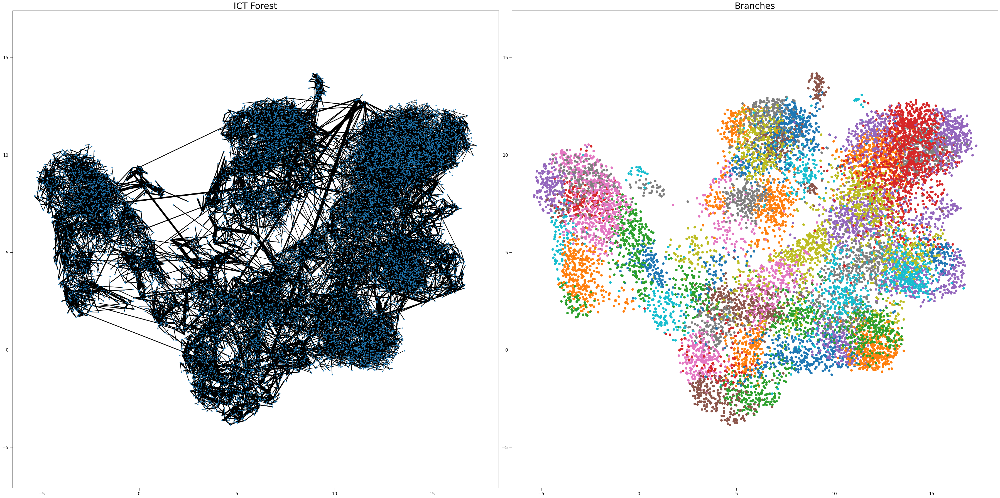

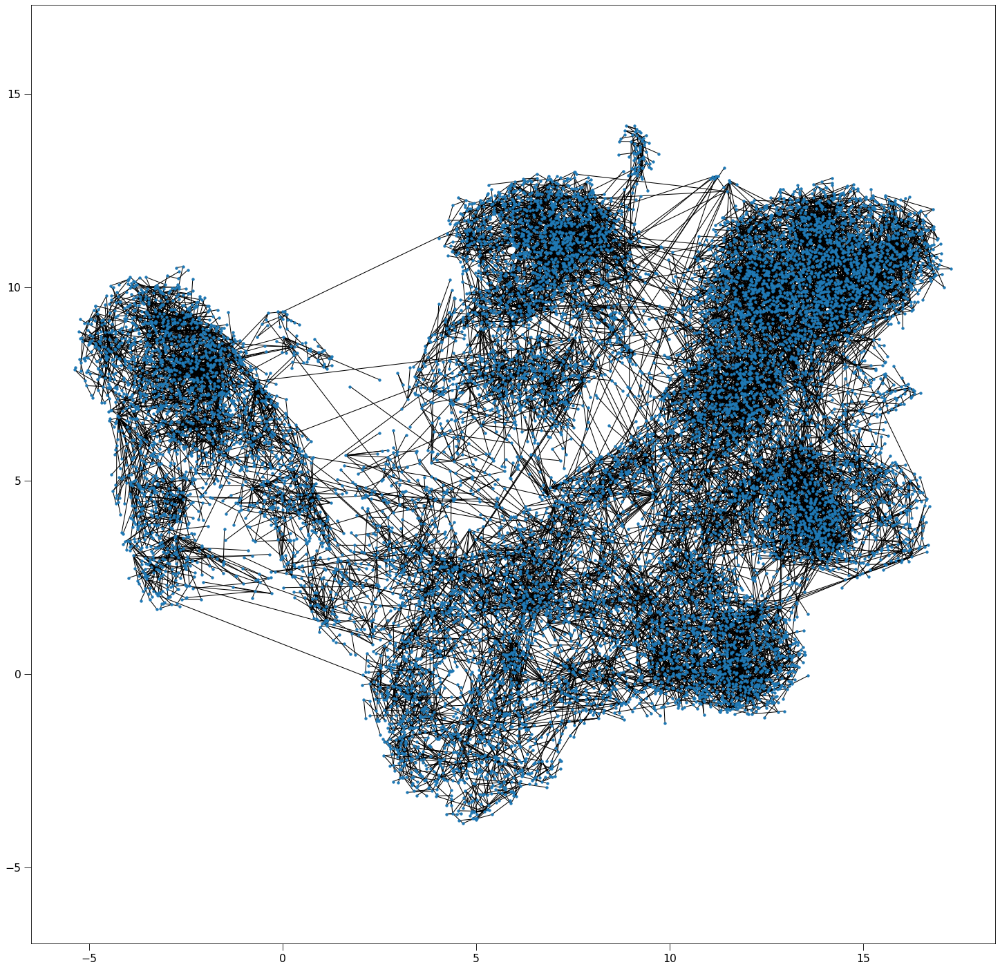

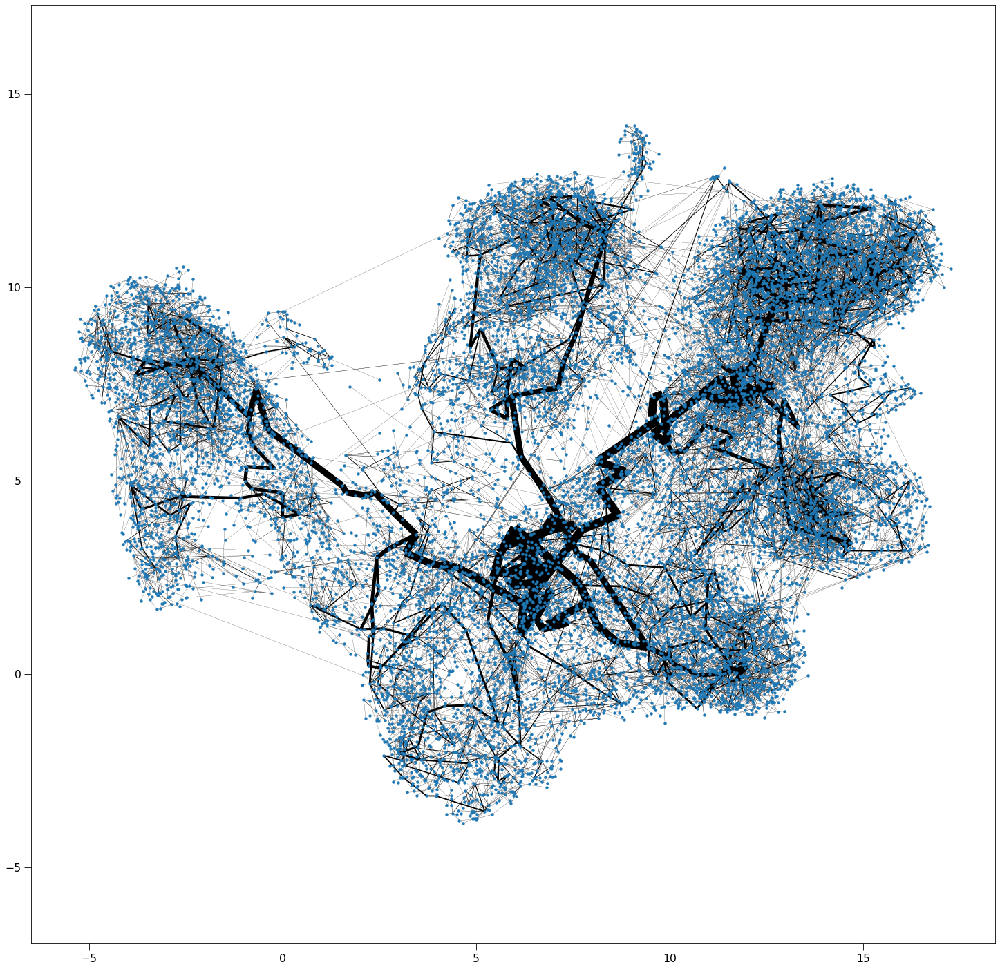

In [11]:
graphs = sub_ICTs
widths = []
for sub_ICT in sub_ICTs:
    if sub_ICT.numberOfNodes() == 1:
        widths.append([])
        continue
    widths.append(compute_widths(sub_ICT))
    
names = ["ICT Forest", "Branches"]

number_of_plots = 2
fig, ax = plt.subplots(1,2, figsize=(24*2,24))

for i, component in enumerate(components):
    nk.viztasks.drawGraph(graphs[i], pos=embedding[component], ax=ax[0], width=widths[i], node_size=10)
            

for component in components:
    ax[1].plot(*embedding[component].T)
    
for i, name in enumerate(names):
    ax[i].set_title(name)
    ax[i].axis("equal")
    ax[i].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
    ax[i].set_axis_on()
    
    
plt.tight_layout()
plt.show()

from sklearn.metrics import pairwise_distances

G = nk.graph.Graph(n=len(position), weighted=True)

distances = pairwise_distances(position, position)

for component, sub_ICT in zip(components, sub_ICTs):
    for u, v, w in sub_ICT.iterEdgesWeights():
        nodeA = component[u]
        nodeB = component[v]
        G.addEdge(nodeA, nodeB, distances[nodeA, nodeB])
        
# plot the not connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()

G = patch_together_nearest(G, pca)
G.indexEdges()

# plot the connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, width=compute_widths(G), node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()

## Cluster ICT

In [12]:
# calculate the cluster ICT with all aim nodes
start = time.time()
ICT = calculate_ICT(G, algorithm_type="cluster_all", cluster_centers=cluster_centers,
                                zeros_stay_zeros=True, update_G=1.1)
ICT.indexEdges()

create edgeId array:   0%|          | 0/13706 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/13706 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13706 [00:00<?, ?it/s]

update Arr 13706 -> 13706
added 8638 edges early
added 5067 edges early


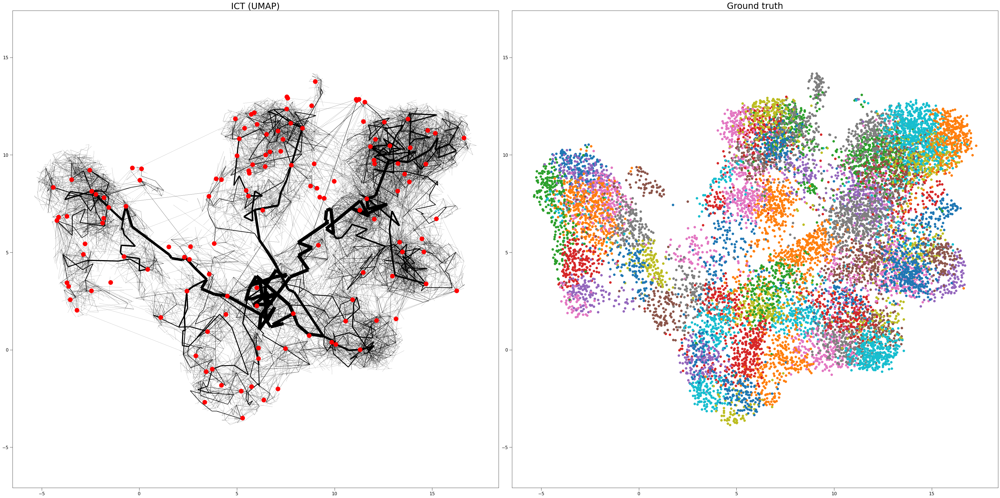

In [13]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))

plot_graph(ICT, embedding, "ICT (UMAP)", ax1, cluster_centers, node_size=0)
plot_points(embedding, "Ground truth", ax2, labels)

ax2.get_legend().remove()
plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-UMAP-"+parameters+".png")

plt.show()

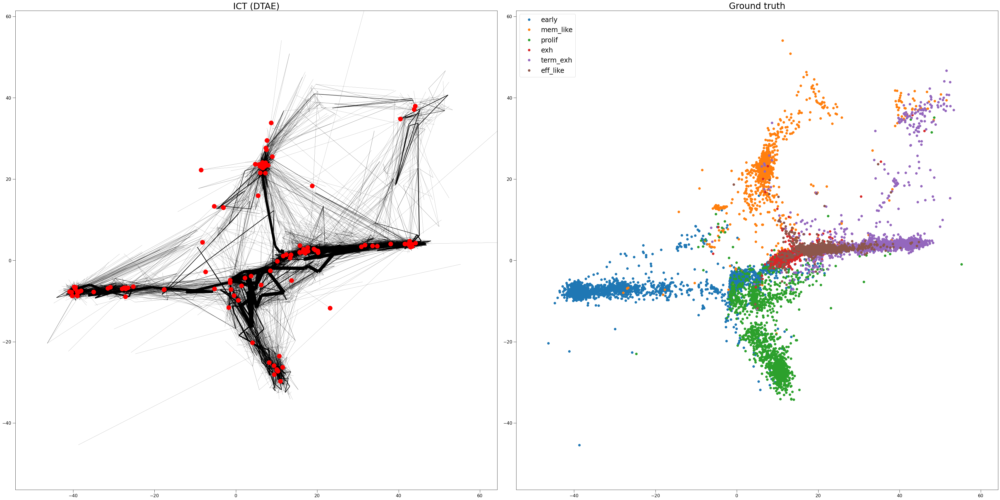

In [14]:
if (dataset == "pancreas_reduced") or (dataset == "pancreas_full") or (dataset=="eth_CC"):
    if dataset == "pancreas_reduced":
        dtae_embedding, dtae_labels = data_loader("pancreas_reduced_DTAE_embedding")
        
    elif dataset == "pancreas_full":
        dtae_embedding, dtae_labels = data_loader("pancreas_full_DTAE_embedding")
        
    elif dataset=="eth_CC":
        dtae_embedding, dtae_labels = data_loader("CC_DTAE_embedding")
    
    else:
        raise RuntimeError("Something went definitively wrong!?")
        
        
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))
    plot_graph(ICT, dtae_embedding, "ICT (DTAE)", ax1, cluster_centers, node_size=0)
    plot_points(dtae_embedding, "Ground truth", ax2, dtae_labels)
    
    if dataset == "eth_CC":
        ax1.set_xlim([-50,60])
        ax2.set_xlim([-50,60])
        ax1.set_ylim([-45,50])
        ax2.set_ylim([-45,50])
    
    plt.tight_layout()
    plt.savefig("./Output/Images/"+dataset+"-DTAE-"+parameters+".png")
    plt.show()

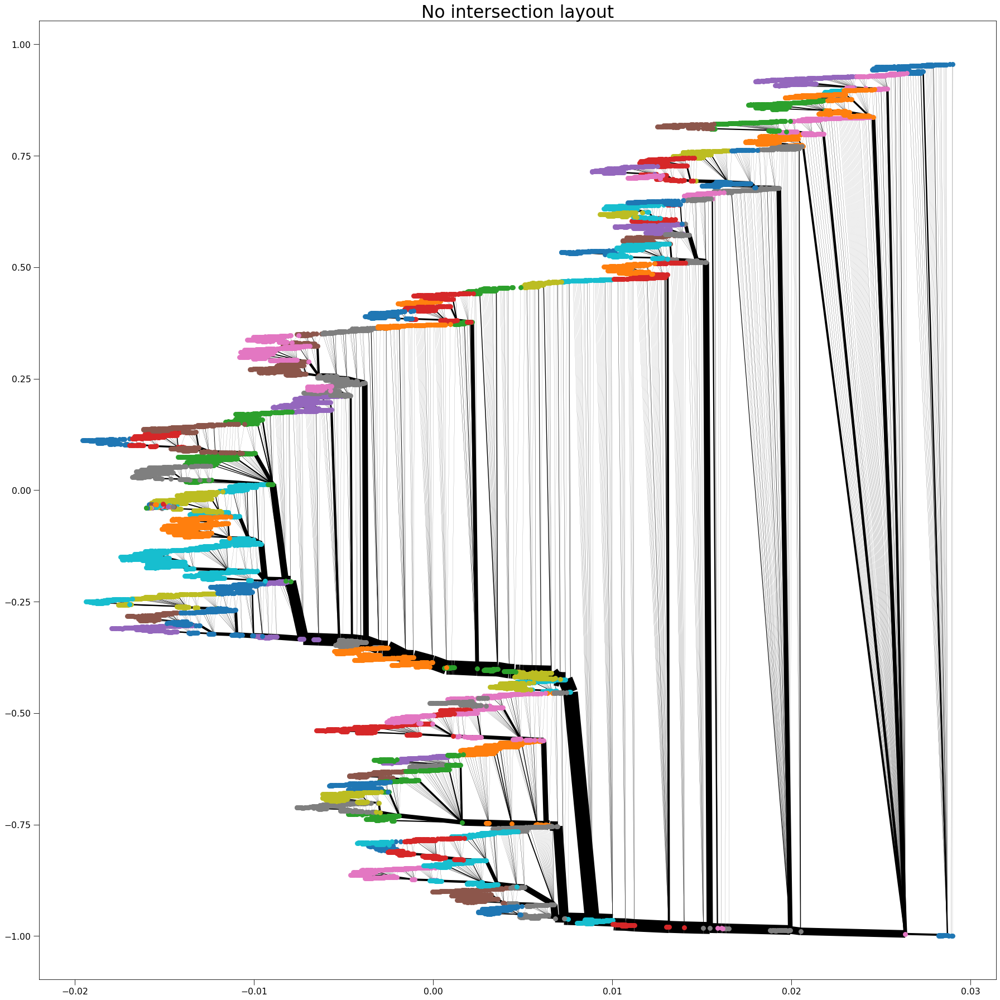

In [15]:
fig, ax = plt.subplots(1, figsize=(24,24))
no_intersections(ICT, embedding, ax, labels)
ax.get_legend().remove()
plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-no-intersection-"+parameters+".png")
plt.show()